<a href="https://colab.research.google.com/github/ikonushok/My_projects/blob/main/GAZP_Media_Hacaton_v3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import librosa #Для параметризации аудио
import matplotlib.pyplot as plt #Для отрисовки графиков
import librosa.display #Для отображения аудио сигналов
from google.colab import files #Для загрузки файлов
import IPython.display as ipd #Для проигрывания аудио
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
path = '/content/drive/MyDrive/GARP-media/music'
os.chdir(path)
track_list = os.listdir()
print('Всего треков в папке: ', len(track_list))
track_list

Всего треков в папке:  29


['Девчонка из сети.mp3',
 'Niletto - Ты такая красивая.mp3',
 'Поболело и прошло.mp3',
 'Лада Приора.mp3',
 'Прочь из моей головы.mp3',
 'За семью печатями.mp3',
 'Танец теней (Safiter & Neqdope Remix).mp3',
 'Seara De Seara.mp3',
 'А я теряю голову.mp3',
 'Окей мы просто играем в жизнь.mp3',
 'Тишины хочу.mp3',
 'Мелодия любви.mp3',
 'Арабская.mp3',
 'Забрал я Сердце.mp3',
 'Лунная соната.mp3',
 'Скрипка.mp3',
 'Вальс дождя.mp3',
 'Machine Phonk.mp3',
 'Emmanuelle.mp3',
 'The Secret Of Christmas.mp3',
 'Свобода.mp3',
 'Гладиатор.mp3',
 'Сектор Газа - Милая.mp3',
 'Faradenza.mp3',
 'LONELINESS.mp3',
 'Верной быть должна жена.mp3',
 'Есть Красивая одна девушка на земле.mp3',
 'Не женюсь , я не женюсь.mp3',
 'No Karantino.mp3']

# Извлечение признаков из аудио сигнала

In [ ]:
#Выбираем файл для примера
#Загрузаем аудио
x, sr = librosa.load(track_list[1]) #x - массив данных временного ряда аудио, sr - частота дискретизации временного ряда
#Выводим данные по сигналу
print(track_list[1])
print(type(x), type(sr))
print(x.shape, sr)
print(x.shape[0]/sr)

Niletto - Ты такая красивая.mp3
<class 'numpy.ndarray'> <class 'int'>
(3916800,) 22050
177.6326530612245


In [ ]:
#Запускаем проигрывание
ipd.Audio(track_list[1])

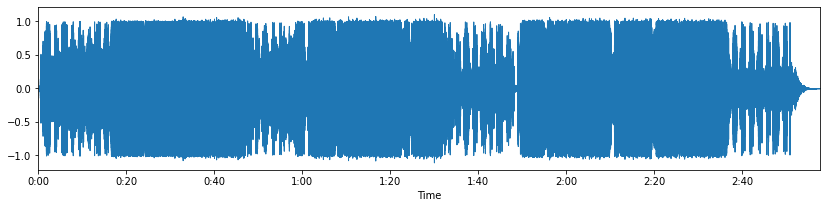

In [ ]:
#Выводим сигнал на экран
plt.figure(figsize=(14, 3)) #задаем размер
librosa.display.waveplot(x, sr=sr) #Построим амплитуду сигнала
plt.show()#выводим график

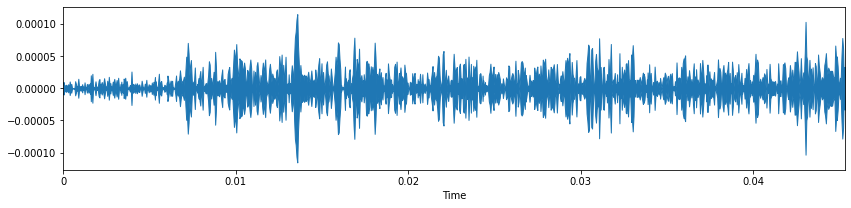

In [ ]:
#Выводим сигнал на экран
plt.figure(figsize=(14, 3))#задаем размер
librosa.display.waveplot(x[500:1500], sr=sr)#первые 1000 значений амплитуды сигнала
plt.show()#выводим график

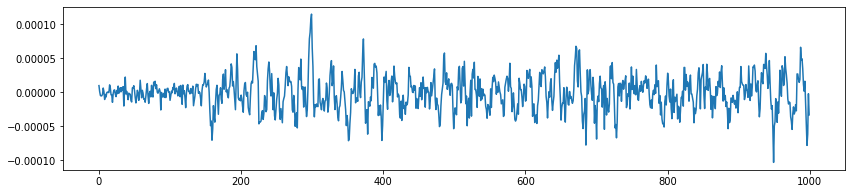

In [ ]:
#Выводим сигнал на экран
plt.figure(figsize=(14, 3))#задаем размер
plt.plot(x[500:1500]) #первые 1000 значений сигнала
plt.show()#выводим график

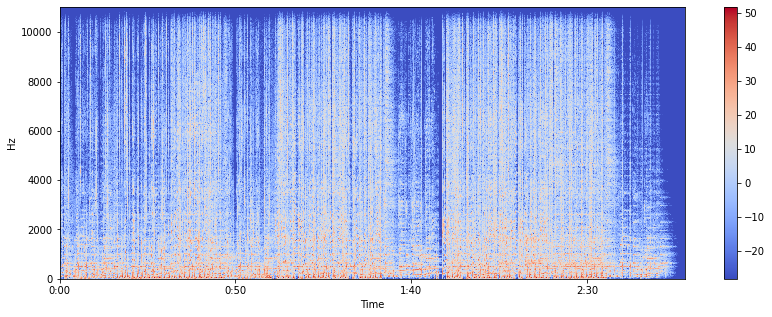

In [ ]:
#Вычисляем спектр сигнала
X = librosa.stft(x)
#Переводим формат спектра в амплитуду
# Меняем шкалу на децибелы(для удобного отображения)
Xdb = librosa.amplitude_to_db(abs(X))

#Выводим спектрограмму на экран
plt.figure(figsize=(14, 5))#задаем размер
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz') #Отобразим спектрограммы
plt.colorbar()#выведем цветовую шкалу
plt.show()#выводим график

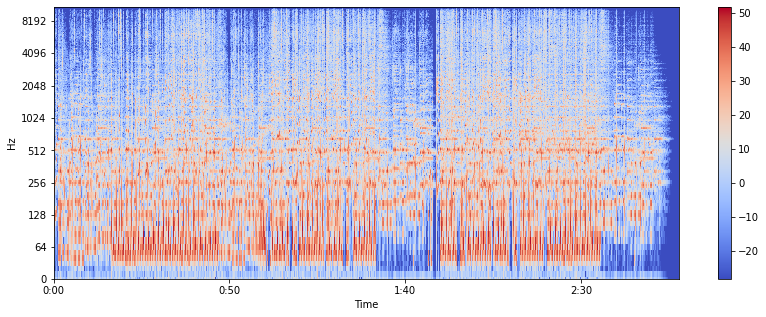

In [ ]:
#Меняем формат оси y на логарифм
plt.figure(figsize=(14, 5))#задаем размер
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')#Отобразим спектрограммы
plt.colorbar()#выведем цветовую шкалу
plt.show()#выводим график

### ПЕРЕСЕЧЕНИЕ НУЛЯ

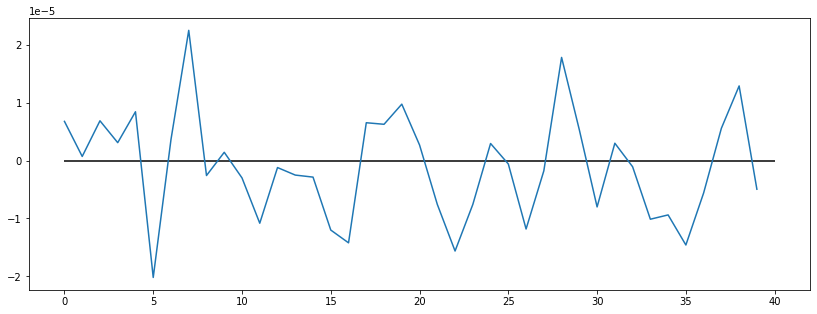

In [ ]:
n0 = 530 #Задаём начальную точку отображения
n1 = 570 #Задаём конечную точку отображения
f = [0, 40]
#Отобраджаем сигнал
plt.figure(figsize=(14, 5))  # задаем размер графика
plt.plot(x[n0:n1]) #От начальной до конечной точки
plt.hlines(0, 0, 40)
plt.grid(which='minor',
        color = 'gray',
        linestyle = ':')
plt.show() #выводим график

In [ ]:
# Раcчитываем пересечения нуля
zero_crossings = librosa.zero_crossings(x[530:570], pad=False)
# Отображаем результаты
print(sum(zero_crossings)) # Суммарное количество пересечений
print(zero_crossings)      # Наличие пересечения в каждой точке

15
[False False False False False  True  True False  True  True  True False
 False False False False False  True False False False  True False False
  True  True False False  True False  True  True  True False False False
 False  True False  True]


### СПЕКТРАЛЬНЫЙ ЦЕНТРОИД

(3916800,)


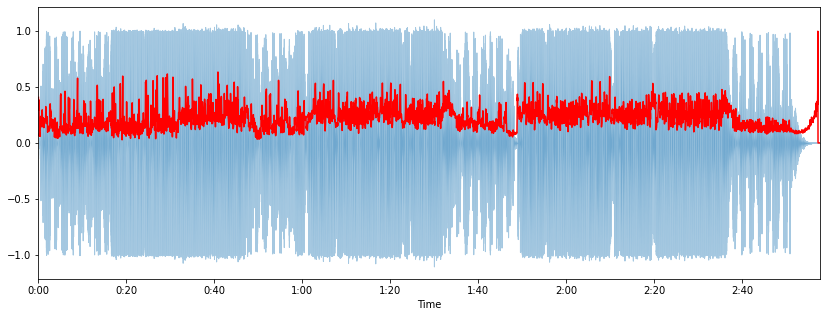

(7651,)


In [ ]:
import sklearn #Для нормирования

#Вычисляем спектральный центроид
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
print(x.shape)
 
#Вычисляем время для визуализации
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

#Нормализуем спектральный центроид к отрезку 0-1
def normalize(x, axis=0):
  return sklearn.preprocessing.minmax_scale(x, axis=axis)
 
#Строим график сигнала и спектрального центроида
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr, alpha=0.4) #Построим амплитуду сигнала
plt.plot(t, normalize(spectral_centroids), color='r') #Построим график нормализованого спектрального центроида 
plt.show()#выводим графики

print(spectral_centroids.shape)

### Спектральный спад частоты

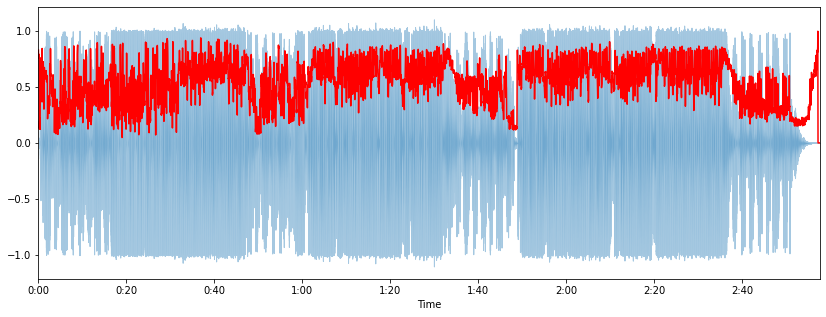

In [ ]:
# Вычисляем и отображаем спектральный спад частоты
spectral_rolloff = librosa.feature.spectral_rolloff(x, sr=sr, roll_percent=0.90)[0]
plt.figure(figsize=(14,5))
librosa.display.waveplot(x, sr=sr, alpha=0.4) # Построим амплитуду сигнала
plt.plot(t, normalize(spectral_rolloff), color='r') # Построим график нормализованого спектрального спада частоты
plt.show() # Выводим график

### Мел-частотные кепстральные коэффициенты

(20, 7651)


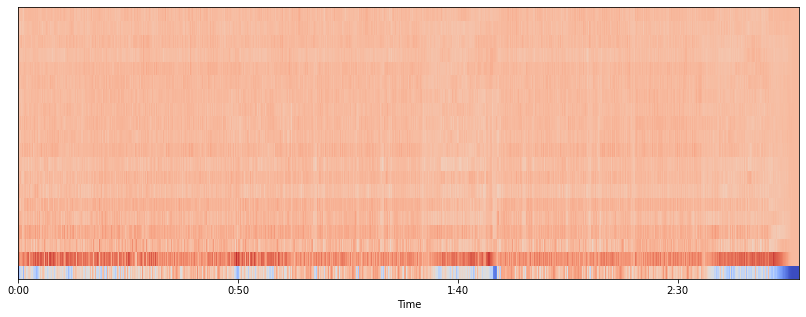

In [ ]:
#Вычисляем и отображаем Мел-частотные кепстральные коэффициенты
mfccs = librosa.feature.mfcc(x, sr=sr)
plt.figure(figsize=(14,5))
print(mfccs.shape) 
librosa.display.specshow(mfccs, sr=sr, x_axis='time') #Отобразим спектрограммы
plt.show()#выведим график

[ 2.22886233e-17  2.97181644e-17 -1.48590822e-17 -2.97181644e-17
  2.97181644e-17  5.94363287e-17  2.08027150e-16  2.97181644e-17
 -8.91544931e-17  0.00000000e+00  1.48590822e-17  2.22886233e-17
 -1.48590822e-17 -1.48590822e-17 -2.97181644e-17 -1.48590822e-17
 -6.68658698e-17  0.00000000e+00 -5.94363287e-17 -2.97181644e-17]
[1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


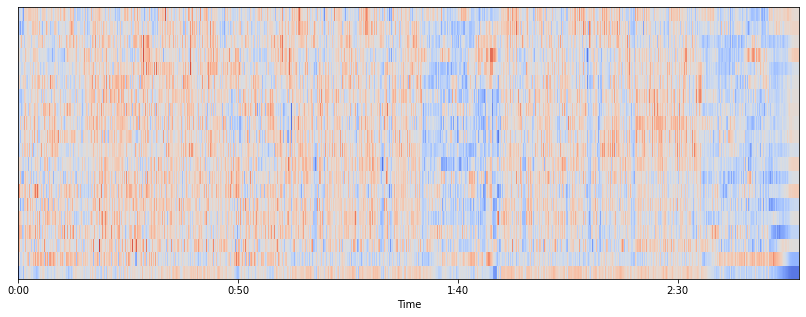

In [ ]:
#Нормируем Мел коэффициенты
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
#Выводим среднее значение
print(mfccs.mean(axis=1))
#Выводим среднеквадратичное отклонение
print(mfccs.var(axis=1))
#Отображаем нормированные коэффициенты
plt.figure(figsize=(14,5))
librosa.display.specshow(mfccs, sr=sr, x_axis='time') #Отобразим спектрограммы
plt.show()#выведим график

### Частота цветности

(12, 7651)


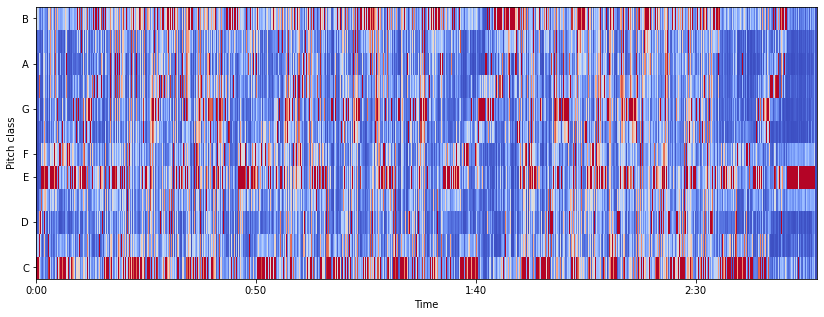

In [ ]:
hop_length = 512 #Задаём размер отрезка сигнала, по которому расcчитывается частоты цветности
#Расчитываем и отображаем частоту цветности
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
print(chromagram.shape)
plt.figure(figsize=(14, 5))#зададим размер графика
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm') #Отобразим спектрограммы
plt.show()#выведим график

# Подготовка данных для нейронки

### Setting up

In [ ]:
# Setting up working space

from tensorflow.keras.models import Sequential, Model, load_model # the type of model
from tensorflow.keras.layers import  (concatenate, Input, Dense, BatchNormalization, Flatten,    # misc
                                      Dropout, SpatialDropout1D,                                # dropout layers
                                      Conv1D, Conv2D,                                            # convolution
                                      GlobalMaxPooling1D,  MaxPooling1D,               # pooling layers
                                      LSTM)                     # recurrent layers
from tensorflow.keras.optimizers import Adam, RMSprop, Nadam # optimizers


from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint


import os                     # for working with the directory
import pandas as pd           # for summary tables & working with dataframes
import numpy as np            # working with arrays
import time                   # for collecting & reporting time info
from datetime import timedelta


# data preprocessing
from tensorflow.keras import utils # recoding ohe
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder

# summary graphs
import matplotlib.pyplot as plt
from tensorflow.keras.utils import plot_model

%matplotlib inline

import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')
import IPython.display as ipd #Для проигрывания аудио
%matplotlib inline

In [ ]:
def feature_extractor (y, sr):
  from librosa import feature as f                          
                                                      
  rmse = f.rmse (y = y)                               #Среднеквадратичная амплитуда
  spec_cent = f.spectral_centroid (y = y, sr = sr)    #Спектральный центроид
  spec_bw = f.spectral_bandwidth (y = y, sr = sr)     #Среднее ширины полосы частот
  rolloff = f.spectral_rolloff (y = y, sr = sr)       #Среднее спектрального спада частоты
  zcr = f.zero_crossing_rate (y)                      #Среднее частоты пересечения нуля звукового временного ряда
  mfcc = f.mfcc(y = y, sr = sr)                       #Мел спектральные коэффициенты
  chroma = f.chroma_stft(y=y, sr=sr)                  #Частота цветности

  output = np.vstack([rmse, spec_cent, spec_bw, rolloff, zcr, chroma, mfcc]).T

  return (output)


def plotter (model):
  plt.plot(model.history.history['accuracy'], label='Training subset')
  plt.plot(model.history.history['val_accuracy'], label='Test subset')
  plt.xlabel('Epoch')
  plt.ylabel('Proportion of correct predictions')
  plt.legend()
  plt.grid()
  return (plt.show())

### Data loading & pre-processing

In [ ]:
from os import walk

path = ('/content/drive/MyDrive/_Проекты/GARP-media/music')
speakers = []
for (dirpath, dirnames, filenames) in walk(path):
    speakers.extend(filenames)
    print(filenames)
    break

['Девчонка из сети.mp3', 'Niletto - Ты такая красивая.mp3', 'Поболело и прошло.mp3', 'Лада Приора.mp3', 'Прочь из моей головы.mp3', 'За семью печатями.mp3', 'Танец теней (Safiter & Neqdope Remix).mp3', 'Seara De Seara.mp3', 'А я теряю голову.mp3', 'Окей мы просто играем в жизнь.mp3', 'Тишины хочу.mp3', 'Мелодия любви.mp3', 'Арабская.mp3', 'Забрал я Сердце.mp3', 'Лунная соната.mp3', 'Скрипка.mp3', 'Вальс дождя.mp3', 'Machine Phonk.mp3', 'Emmanuelle.mp3', 'The Secret Of Christmas.mp3', 'Свобода.mp3', 'Гладиатор.mp3', 'Сектор Газа - Милая.mp3', 'Faradenza.mp3', 'LONELINESS.mp3', 'Верной быть должна жена.mp3', 'Есть Красивая одна девушка на земле.mp3', 'Не женюсь , я не женюсь.mp3', 'No Karantino.mp3']


In [ ]:
print(len(speakers))
speakers[0]

29


'Девчонка из сети.mp3'

In [ ]:
# Creating X & Y variables
os.chdir('/content/drive/MyDrive/_Проекты/GARP-media/music')


xtrain = []
ytrain = []
length = 90      # это для нарезки на ровные отрезки : 90 секунд для каждого трека
dur = 2          # длительность одного фрагмента в секундах
step = 2

''' То есть 90 секунд //dur секунды - это в цикле для того,
чтобы была одинаковая размерность тензоров
'''

for i in range(len(speakers)):
    track = speakers[i]                                                # for each speaker
    y, sr = librosa.load (track, mono = True) 
    start = 0
    for j in range(length//dur):
        y, sr = librosa.load (track, mono = True, offset = start, duration = dur)   #y - массив данных временного ряда аудио, sr - частота дискретизации временного ряда
        output = feature_extractor(y, sr)                              
        xtrain.append(output)
        ytrain.append(utils.to_categorical(i, len(speakers)))        
        start += step
     
    print(i, ' processed:\t ', speakers[i])

0  processed:	  Девчонка из сети.mp3
1  processed:	  Niletto - Ты такая красивая.mp3
2  processed:	  Поболело и прошло.mp3
3  processed:	  Лада Приора.mp3
4  processed:	  Прочь из моей головы.mp3
5  processed:	  За семью печатями.mp3
6  processed:	  Танец теней (Safiter & Neqdope Remix).mp3
7  processed:	  Seara De Seara.mp3
8  processed:	  А я теряю голову.mp3
9  processed:	  Окей мы просто играем в жизнь.mp3
10  processed:	  Тишины хочу.mp3
11  processed:	  Мелодия любви.mp3
12  processed:	  Арабская.mp3
13  processed:	  Забрал я Сердце.mp3
14  processed:	  Лунная соната.mp3
15  processed:	  Скрипка.mp3
16  processed:	  Вальс дождя.mp3
17  processed:	  Machine Phonk.mp3
18  processed:	  Emmanuelle.mp3
19  processed:	  The Secret Of Christmas.mp3
20  processed:	  Свобода.mp3
21  processed:	  Гладиатор.mp3
22  processed:	  Сектор Газа - Милая.mp3
23  processed:	  Faradenza.mp3
24  processed:	  LONELINESS.mp3
25  processed:	  Верной быть должна жена.mp3
26  processed:	  Есть Красива

In [ ]:
# transforming into numpy array
xtrain = np.array(xtrain)
ytrain = np.array(ytrain)
xtrain_backup = xtrain.copy()
ytrain_backup = ytrain.copy()

# Checking out the resutls 
y_train_class = np.argmax(ytrain, axis=1)
print(y_train_class)
print('X shape:', xtrain.shape)   
print('Y shape:', ytrain.shape)

[ 0  0  0 ... 28 28 28]
X shape: (1305, 87, 37)
Y shape: (1305, 29)


In [ ]:
np.save('/content/drive/MyDrive/_Проекты/GARP-media/data/xtrainU.npy', xtrain)
np.save('/content/drive/MyDrive/_Проекты/GARP-media/data/ytrainU.npy', ytrain)

In [ ]:
a = xtrain[1]*xtrain[2]
a

array([[ 2.22645208e-02,  2.15291011e+06,  5.20355848e+06, ...,
        -2.59115101e+01, -2.25866255e+01, -8.44335981e+00],
       [ 2.12895479e-02,  2.30744915e+06,  4.92972876e+06, ...,
        -2.24295887e+01, -1.91557336e+01, -2.36049522e+01],
       [ 1.83198134e-02,  2.75243493e+06,  4.69088399e+06, ...,
        -3.03135069e+01, -5.75100790e+01, -3.62487972e+01],
       ...,
       [ 4.86833916e-03,  1.67176579e+06,  3.04283998e+06, ...,
         3.30745431e+01, -6.48835150e+00,  1.43068111e+02],
       [ 4.57709081e-03,  1.39639014e+06,  2.74042422e+06, ...,
        -4.88864721e+00,  2.34123390e-01,  1.00642080e+02],
       [ 4.58538220e-03,  1.25029028e+06,  2.58265024e+06, ...,
         3.97924030e+01, -9.36278892e-03,  4.73255214e+01]])

In [ ]:
# Scaling the data
print('Xtrain[0] before scaling:\n', xtrain[0][0])
scaler = StandardScaler()
xtrain1 = scaler.fit_transform(xtrain.reshape(xtrain.shape[0], xtrain.shape[1] * xtrain.shape[2]))
xtrain = xtrain1.reshape(xtrain.shape[0], xtrain.shape[1], xtrain.shape[2])
print('\nXtrain[0] after scaling:\n', xtrain[0])

Xtrain[0] before scaling:
 [ 1.70684638e-04  4.21933672e+03  2.05439361e+03  6.36306152e+03
  1.80175781e-01  4.55207300e-01  3.17650462e-01  3.44546813e-01
  4.83048675e-01  3.26969597e-01  3.62438298e-01  6.31402831e-01
  3.02859341e-01  5.27085670e-01  4.20398527e-01  7.26441384e-01
  1.00000000e+00 -5.31459350e+02  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00]

Xtrain[0] after scaling:
 [[-1.55914355  1.72874451 -0.58189321 ... -0.089991    0.20943797
  -0.03872084]
 [-1.62696978  1.60255824 -0.63776695 ... -0.08156876  0.32567878
  -0.08424342]
 [-1.6712402   1.54634398 -0.54686568 ... -0.19181155  0.69452457
  -0.12880885]
 ...
 [ 0.22751116  0.72632304  0.86334343 ... -0.70617232 -0.49979167
  -1.14594338]
 [ 1.04489129 

In [ ]:
#Train & test data split
x_train, x_test, y_train, y_test = train_test_split(xtrain, y_train_class, test_size=0.1, shuffle=True)

In [ ]:
#Выводим размеры обучающей и проверочной выборки для проверки
print('Train data info:')
print('X shape', x_train.shape)
print('Y shape', y_train.shape)
print('\nTest data info:')
print('X shape', x_test.shape)
print('Y shape', y_test.shape)

Train data info:
X shape (1174, 87, 37)
Y shape (1174,)

Test data info:
X shape (131, 87, 37)
Y shape (131,)


# Мodelling

In [ ]:
def modelConv(dense1 = 128, filters1 = 256, filters2 = 256, kernel1 = 5, kernel2 = 10, activ1 = 'relu', activ2 = 'softmax', optim = Adam):
    model = Sequential()
    model.add(Conv1D(filters = filters1, kernel_size = kernel1, activation = activ1, input_shape = (x_train.shape[1],x_train.shape[2])))
    model.add(Conv1D(filters = filters1, kernel_size = kernel1, activation = activ1))
    model.add(Conv1D(filters = filters1, kernel_size = kernel1, activation = activ1))
    model.add(GlobalMaxPooling1D())

    model.add(Dense(dense1, activation = activ1))
    model.add(Dense(len(speakers), activation=activ2))

    model.compile(optimizer = optim(lr =1e-4), loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
    return (model)



Epoch 00001: val_accuracy improved from -inf to 0.42748, saving model to model_GAZP_media.h5

Epoch 00002: val_accuracy improved from 0.42748 to 0.55725, saving model to model_GAZP_media.h5

Epoch 00003: val_accuracy improved from 0.55725 to 0.67939, saving model to model_GAZP_media.h5

Epoch 00004: val_accuracy improved from 0.67939 to 0.80916, saving model to model_GAZP_media.h5

Epoch 00005: val_accuracy improved from 0.80916 to 0.85496, saving model to model_GAZP_media.h5

Epoch 00006: val_accuracy improved from 0.85496 to 0.90076, saving model to model_GAZP_media.h5

Epoch 00007: val_accuracy improved from 0.90076 to 0.90840, saving model to model_GAZP_media.h5

Epoch 00008: val_accuracy improved from 0.90840 to 0.91603, saving model to model_GAZP_media.h5

Epoch 00009: val_accuracy did not improve from 0.91603

Epoch 00010: val_accuracy did not improve from 0.91603

Epoch 00011: val_accuracy did not improve from 0.91603

Epoch 00012: val_accuracy improved from 0.91603 to 0.92366

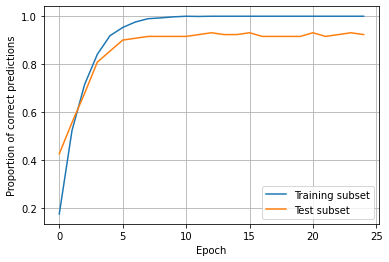

Training accuracy achieved: 1.0
Validation accuracy achieved: 0.9236640930175781


In [ ]:
model = modelConv() 
os.chdir('/content/drive/MyDrive/GARP-media/data')

# коллбэки
early_stopping = EarlyStopping(monitor = 'val_accuracy', patience = 12, verbose = 0, 
                               restore_best_weights = True, mode='max')
reduce_lr = ReduceLROnPlateau(monitor = 'val_loss', factor=0.8, patience=4, min_lr=1e-07, verbose = 1)
checkpoint = ModelCheckpoint('model_GAZP_media.h5', monitor='val_accuracy', verbose = 1,
                             save_best_only = True, mode='max')

model.fit(x_train, y_train, epochs = 100,
          validation_data = (x_test, y_test), verbose = 0,
          callbacks = [early_stopping, reduce_lr, checkpoint])


plotter(model)
print('Training accuracy achieved:', (model.history.history['accuracy'])[-1])
print('Validation accuracy achieved:', (model.history.history['val_accuracy'])[-1])

# Распознавание трека / Track identification


**Распознание мы будем проводить на НОВЫХ данных - из другого фрагмента записи, чем данные обучения и валидации.**

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_20 (Conv1D)           (None, 83, 256)           47616     
_________________________________________________________________
conv1d_21 (Conv1D)           (None, 79, 256)           327936    
_________________________________________________________________
conv1d_22 (Conv1D)           (None, 75, 256)           327936    
_________________________________________________________________
global_max_pooling1d_5 (Glob (None, 256)               0         
_________________________________________________________________
dense_14 (Dense)             (None, 128)               32896     
_________________________________________________________________
dense_15 (Dense)             (None, 29)                3741      
Total params: 740,125
Trainable params: 740,125
Non-trainable params: 0
________________________________________________

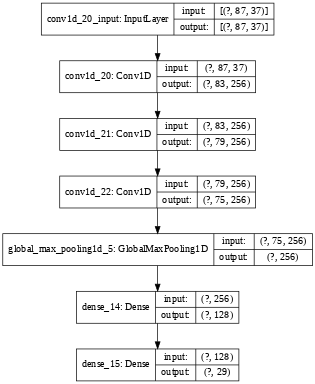

In [ ]:
# загружаем предобученную ранее модель
os.chdir('/content/drive/MyDrive/GARP-media/data')

model = load_model('model_GAZP_media.h5')
print(model.summary()) #Вывод структуры модели
plot_model(model, dpi=50, show_shapes=True, show_layer_names=True)

In [ ]:
# Проверим распознание испытуемого на НОВОМ фрагменте
# NB: для этого испытуемого у нас была очень короткая запись для валидации

path = ('/content/drive/MyDrive/_Проекты/GARP-media/music/')

for j in range(len(speakers)):
  start = length # мы ранее анализировали фрагмент только до length секунды
  samples = 3
  sum = 0
  for i in range (samples):
    y, sr = librosa.load(path + speakers[j], mono=True, offset = start, duration = dur)
    output = feature_extractor(y, sr)
    output = output.reshape(1, xtrain.shape[1], xtrain.shape[2]) 
    output = scaler.transform(output.reshape(1, xtrain.shape[1] * xtrain.shape[2]))
    output = output.reshape(1, xtrain.shape[1], xtrain.shape[2])
    x = model.predict(output)

    if np.argmax(x) == speakers.index(speakers[j]):
        sum+=1
    start += step

    print('Prediction for: ', speakers[j], '\t', dur,'-second sample:', speakers[np.argmax(x)])
  print('\nAverage accuracy for speaker: ', j, ' = ', sum/samples)
  print('-'*30)

Prediction for:  Девчонка из сети.mp3 	 2 -second sample: Девчонка из сети.mp3
Prediction for:  Девчонка из сети.mp3 	 2 -second sample: Лада Приора.mp3
Prediction for:  Девчонка из сети.mp3 	 2 -second sample: Девчонка из сети.mp3

Average accuracy for speaker:  0  =  0.6666666666666666
------------------------------
Prediction for:  Niletto - Ты такая красивая.mp3 	 2 -second sample: Niletto - Ты такая красивая.mp3
Prediction for:  Niletto - Ты такая красивая.mp3 	 2 -second sample: Тишины хочу.mp3
Prediction for:  Niletto - Ты такая красивая.mp3 	 2 -second sample: Свобода.mp3

Average accuracy for speaker:  1  =  0.3333333333333333
------------------------------
Prediction for:  Поболело и прошло.mp3 	 2 -second sample: Поболело и прошло.mp3
Prediction for:  Поболело и прошло.mp3 	 2 -second sample: Поболело и прошло.mp3
Prediction for:  Поболело и прошло.mp3 	 2 -second sample: Поболело и прошло.mp3

Average accuracy for speaker:  2  =  1.0
------------------------------
Predictio

**Сумма верных ответов почти во всех случаях = количеству фрагментов. Следовательно наша модель верно опознаёт трэк по фрагменту из 3 секунд.**